In [0]:
from skimage import measure
import numpy as np
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.mplot3d import Axes3D
import sklearn
import sklearn.cluster
import itertools
import statistics
import cv2
import scipy

Populating the interactive namespace from numpy and matplotlib


Saving DSC_2144.jpg to DSC_2144.jpg


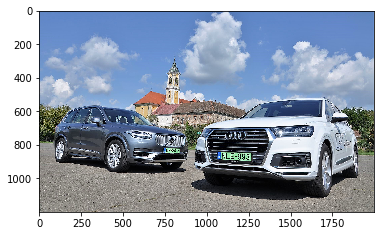

In [0]:
from google.colab import files
file = files.upload()

img = mpimg.imread("DSC_2144.jpg")
imgplot = plt.imshow(img)
plt.show()

## Segmentation

(1200, 2000, 3)
(1200, 2000)
[168 167 166 ... 157 146 136]
<class 'numpy.ndarray'>
[[168 167 166 ... 162 164 165]
 [167 166 165 ... 161 163 164]
 [166 165 163 ... 160 161 162]
 ...
 [152 149 141 ... 143 151 163]
 [163 154 144 ... 153 154 157]
 [162 154 152 ... 157 146 136]]
(1200, 2000)
<class 'numpy.uint8'>


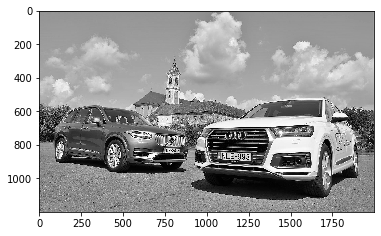

In [0]:
gimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print(np.shape(img))
print(np.shape(gimg))
print(gimg.flatten())
print(type(gimg))
print(gimg)
print(gimg.shape)
print(type(gimg[0][0]))
plt.imshow(gimg,cmap='gray')
plt.show()

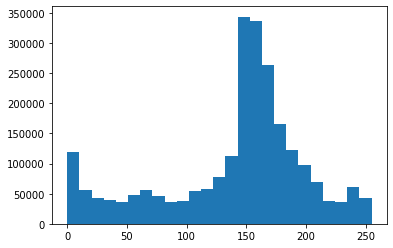

In [0]:
plt.hist(gimg.flatten(),bins=25);

### Mean

In [0]:
print(gimg.mean())

140.67476875


### Otsu

In [0]:
thr,res = cv2.threshold(gimg,0,1,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
print(thr)

107.0


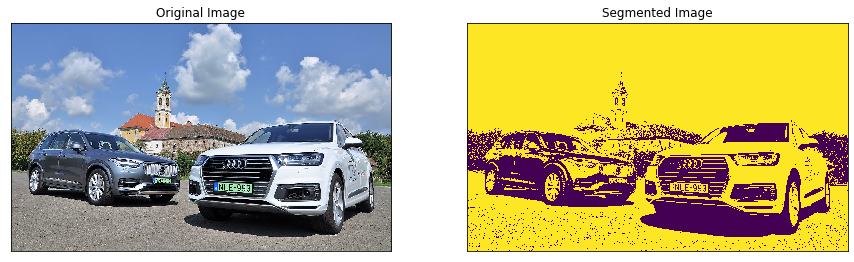

In [0]:
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(res)
plt.title('Segmented Image'), plt.xticks([]), plt.yticks([])
plt.show()

### TASK: segment the image according to mean

140.0


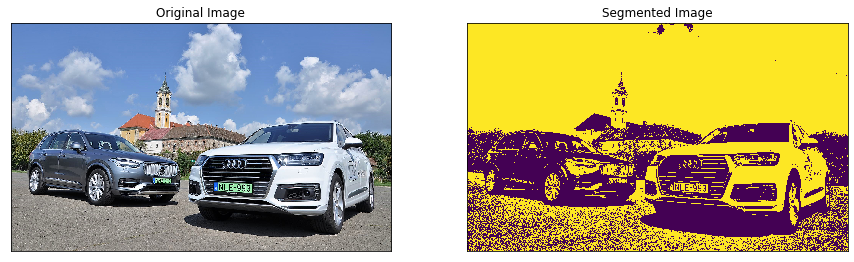

In [0]:
thr,res = cv2.threshold(gimg,gimg.mean(),1,cv2.THRESH_BINARY)
print(thr)
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(res)
plt.title('Segmented Image'), plt.xticks([]), plt.yticks([])
plt.show()

### kmeans clustering in RGB space

In [0]:
r = img[::20,::20,0].flatten()
g = img[::20,::20,1].flatten()
b = img[::20,::20,2].flatten()
np.shape(r)

(6000,)

### RGB space

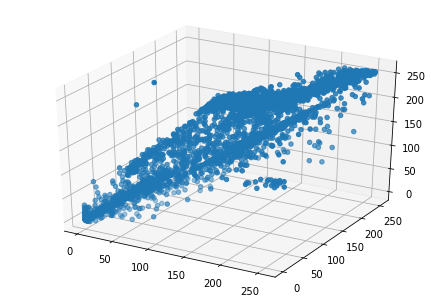

In [0]:
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(r, g, b)
plt.show()

### Kmeans clustering
Here D is a parameter to decimate the number of points

In [0]:
D = 10
sm_img = img[::D,::D,:]
rgb = sm_img.reshape((-1,3))
kmeans = sklearn.cluster.KMeans(n_clusters=2).fit(rgb)

In [0]:
kmeans.cluster_centers_

array([[ 39.51418505,  44.05618394,  49.70980901],
       [145.00166604, 162.43381523, 189.26957597]])

Now the real clustering but using the centers from the decimated. It is faster in two steps.

In [0]:
rgb = img.reshape((-1,3))
kmeans = sklearn.cluster.KMeans(n_clusters=2,init=kmeans.cluster_centers_).fit(rgb)

/usr/local/lib/python3.6/dist-packages/sklearn/cluster/k_means_.py:972: RuntimeWarning: Explicit initial center position passed: performing only one init in k-means instead of n_init=10
  return_n_iter=True)


Cluster the ponts of the images

In [0]:
pred = kmeans.predict(rgb)
print(pred)
res = pred.reshape((1200,2000))
np.shape(res)

[0 0 0 ... 0 0 0]


(1200, 2000)

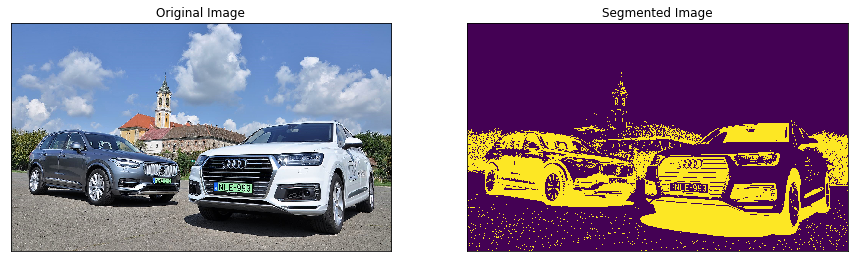

In [0]:
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(res)
plt.title('Segmented Image'), plt.xticks([]), plt.yticks([])
plt.show()

### Find connected components

In [0]:
print(res)
print(np.shape(res))
regions, num = measure.label(res, return_num=True,connectivity=1,background=-10)
print(regions.shape)
print(regions)
patches = measure.regionprops(regions)
print(len(patches))
print(num)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
(1200, 2000)
(1200, 2000)
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
15329
15329


In [0]:
print(patches[2].area,patches[2].bbox)

2 (264, 811, 266, 812)


### TASK: select regions which fulfill the following conditions
 * area > 100
 * area < 0.9 * area of the whole image
 * aspect ratio is between 2 and 5 and lying flat
 1. Draw rectangles around the objects
 2. Plot the corresponding part from the original image

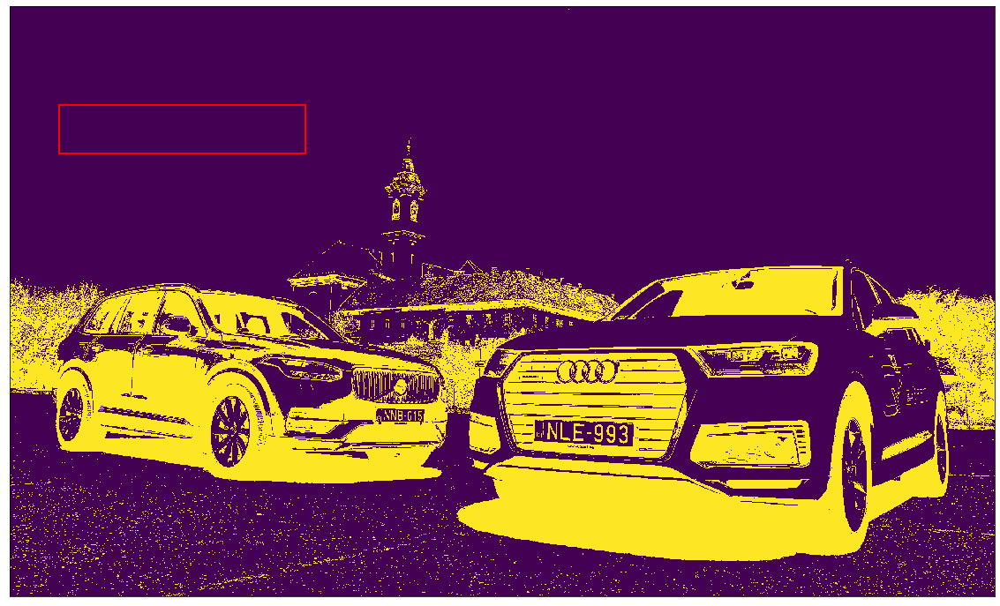

In [0]:
#plot rectangle

fig, (ax1) = plt.subplots(1,figsize=(20,20))
plt.xticks([]),plt.yticks([])
ax1.imshow(res);
rectBorder = matplotlib.patches.Rectangle((100, 200), 500, 100, edgecolor="red", linewidth=2, fill=False)
ax1.add_patch(rectBorder)
plt.show()

1166400.0
[(529, 1200, 643, 1693), (545, 657, 686, 1239), (546, 749, 561, 780), (550, 662, 568, 721), (557, 1461, 576, 1510), (560, 0, 971, 1642), (667, 745, 711, 850), (670, 431, 699, 528), (672, 256, 751, 456), (690, 1387, 753, 1630), (719, 1111, 768, 1239), (720, 508, 764, 694), (720, 552, 734, 613), (736, 698, 798, 865), (741, 569, 754, 608), (763, 906, 1129, 1912), (791, 247, 800, 280), (814, 180, 852, 367), (819, 742, 852, 842), (833, 1014, 854, 1063), (841, 1065, 896, 1267), (842, 1381, 941, 1627), (880, 1396, 940, 1605)]


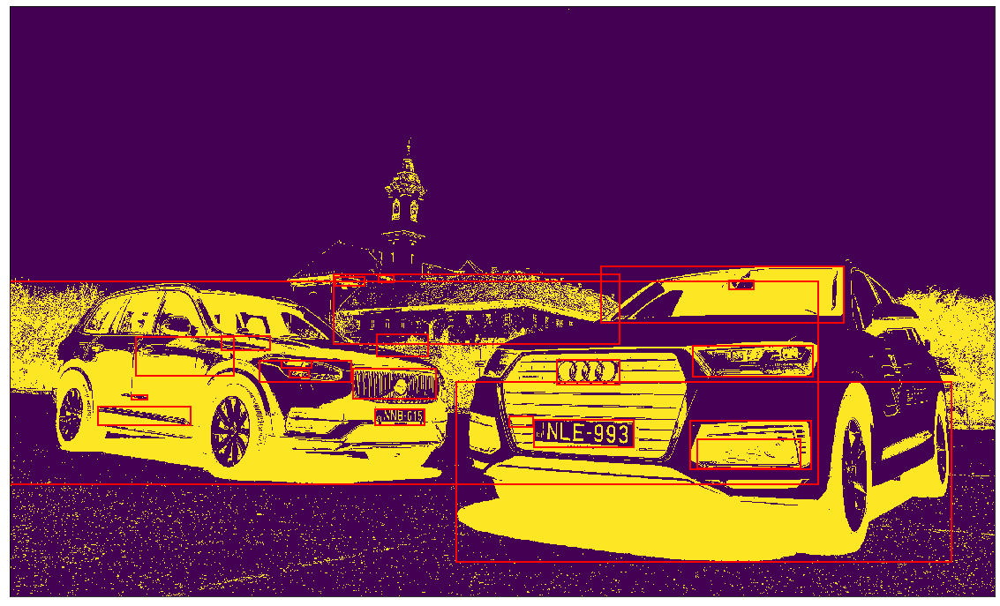

In [0]:
scaled_img_area = (len(img) * 0.9)**2
print(scaled_img_area)
good = [p for p in patches if p.area > 100 and p.area < scaled_img_area and 5 > ((p.bbox[3] - p.bbox[1]) / (p.bbox[2] - p.bbox[0])) > 2]
print([g.bbox for g in good])
fig, (ax1) = plt.subplots(1,figsize=(20,20))
plt.xticks([]),plt.yticks([])
ax1.imshow(res);
for g in good:
  bottom = g.bbox[1]
  left = g.bbox[0]
  top = g.bbox[3]
  right = g.bbox[2]
  width = right - left
  height = top - bottom
  rectBorder = matplotlib.patches.Rectangle((bottom, left), height, width, edgecolor="red", linewidth=2, fill=False)
  ax1.add_patch(rectBorder)
plt.show()

## Pattern matching

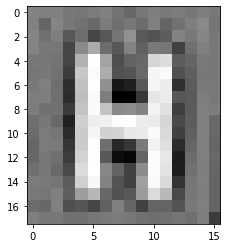

In [0]:
fig, ax = plt.subplots()
ax.imshow(gimg[863:881,1067:1083],cmap='gray');

### Create pattern

In [0]:
template = gimg[863:881,1067:1083]
w, h = template.shape[::-1]

### Find pattern

In [0]:
res = cv2.matchTemplate(gimg,template,cv2.TM_CCOEFF_NORMED)

In [0]:
np.shape(res)

(1183, 1985)

### Fantastic beasts and where to find them

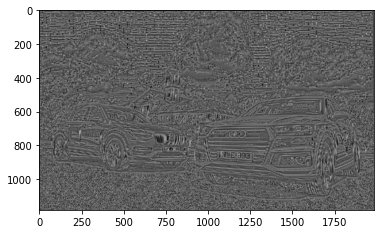

In [0]:
gimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(res,cmap='gray')
plt.show()

In [0]:
threshold = 0.6
loc = np.where( res >= threshold)
print(loc)
print(len(loc[0]))
print(len(loc[1]))

(array([862, 863, 864]), array([1067, 1067, 1067]))
3
3


### TASK
 1. plot the corresponding part of the image
 2. decrease the threshold to 0.6, 0.5, 0.45 (do not go much below!)

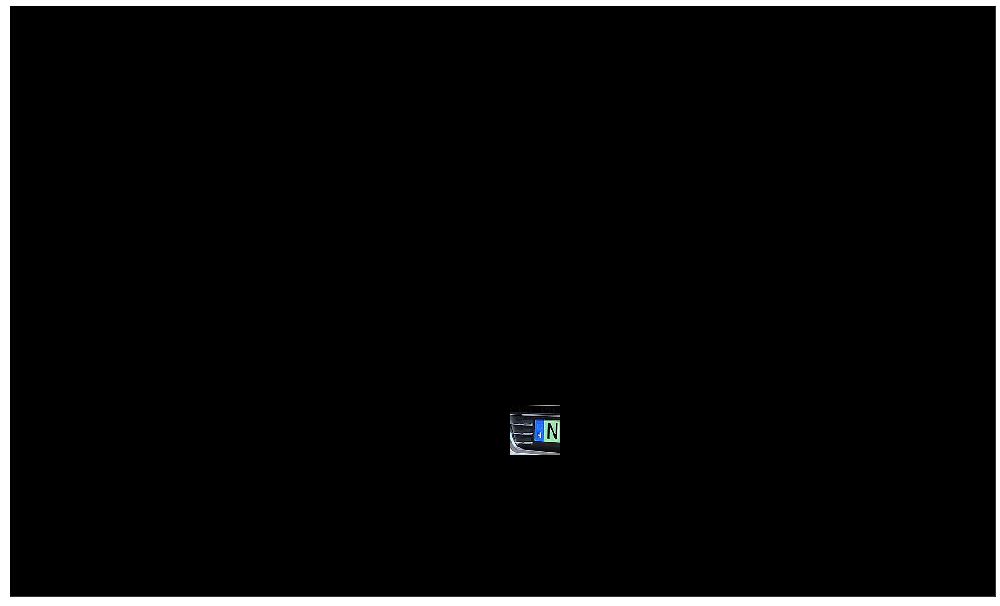

In [0]:
x_good = np.array([list(range(x-50,x+50)) for x in loc[0]]).flatten()
y_good = np.array([list(range(x-50,x+50)) for x in loc[1]]).flatten()
filt = [[img[i,j] if j in y_good and i in x_good else [0] * 3 for j in range(img.shape[1])] for i in range(img.shape[0])]
filtarray = np.array(filt, dtype=int)
ig, (ax1) = plt.subplots(1,figsize=(20,20))
plt.xticks([]),plt.yticks([])
ax1.imshow(filtarray);


### TASK
 1. write a code which resizes the pattern (factors: 0.5-2) and searches for its matches, can you find the other H?
<pre>cv2.resize(template,new_x,new_y)</pre> does the trick
 2. plot the fount plate number with the numbers included

In [0]:
template2 = cv2.resize(template, (0,0), fx=0.5,fy=0.5)
res2 = cv2.matchTemplate(gimg,template2,cv2.TM_CCOEFF_NORMED)
threshold2 = 0.6
loc2 = np.where( res2 >= threshold2)
print(loc2)
print(len(loc2[0]))
print(len(loc2[1]))



(array([392, 833, 892]), array([ 797,  746, 1175]))
3
3


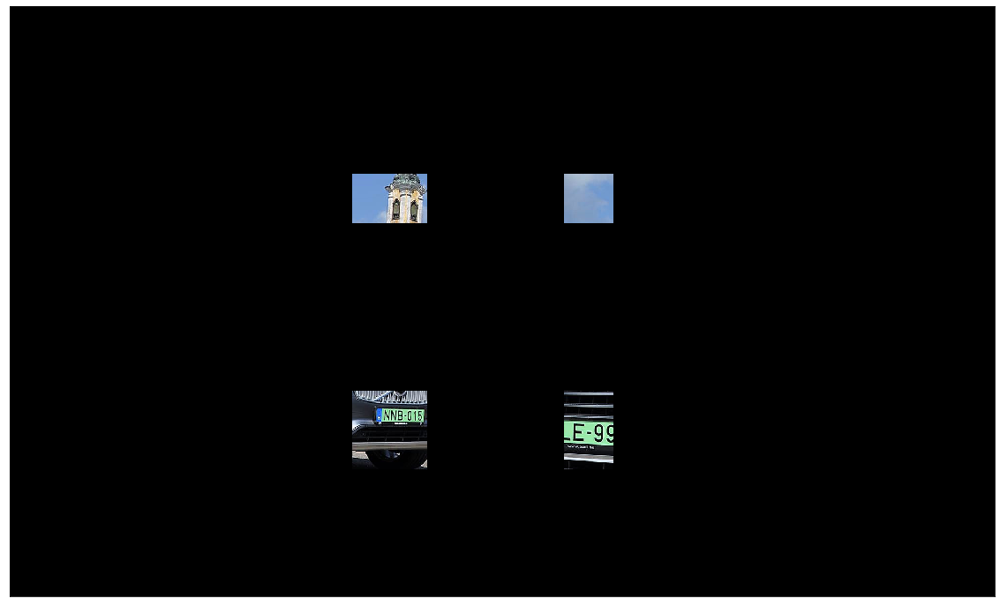

In [0]:
x_good = np.array([list(range(x-50,x+50)) for x in loc2[0]]).flatten()
y_good = np.array([list(range(x-50,x+50)) for x in loc2[1]]).flatten()
filt = [[img[i,j] if j in y_good and i in x_good else [0] * 3 for j in range(img.shape[1])] for i in range(img.shape[0])]
filtarray = np.array(filt, dtype=int)
ig, (ax1) = plt.subplots(1,figsize=(20,20))
plt.xticks([]),plt.yticks([])
ax1.imshow(filtarray);


HOMEWORK

0.  Get patches of patches
1.  Aspect ration 0.2-1 (numbers are standing rectangles)
2. Size of 0.01-0.2 of the small patch (should not be too small or big)
3.  From these exclude the ones which are fully inside of an other
4.   Keep those which have almost the same height 
5.   And are on one line

NOTE: left and  bottom in bbox is swtiched, naming convention almost never follows this except in the last few steps







0. Get patches of patches

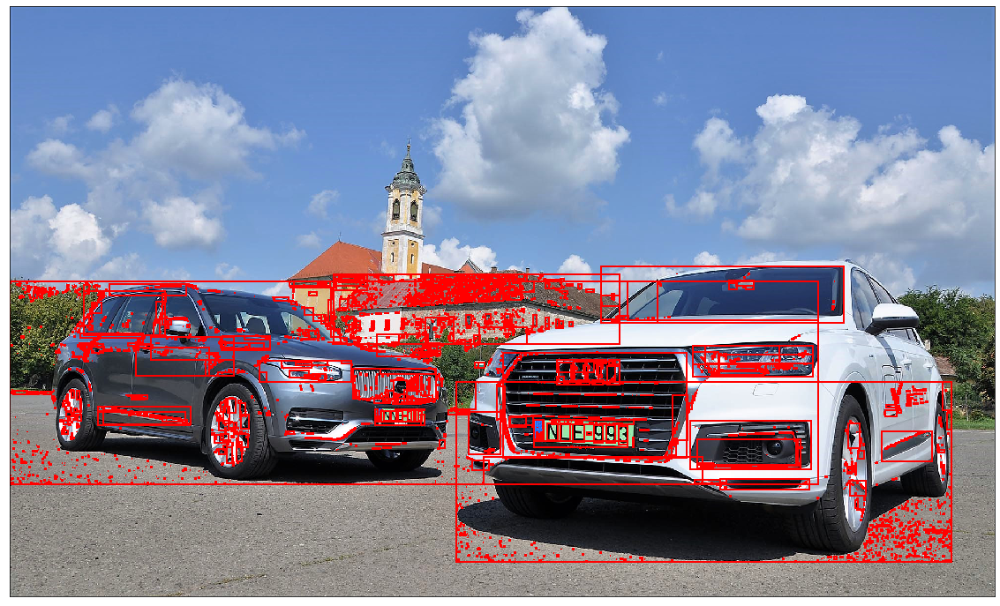

In [0]:
figsize=20
scaled_img_area = (len(img) * 0.9)**2
new_patches = {}
fig, (ax2) = plt.subplots(1, figsize=(figsize, figsize))
plt.xticks([]),plt.yticks([])
ax2.imshow(img);
# good: prefiltered patches
for p in good:
  bottom = p.bbox[1]
  left = p.bbox[0]
  top = p.bbox[3]
  right = p.bbox[2]
  width = right - left
  height = top - bottom
  x_range = range(left, right)
  y_range = range(bottom, top)
  # res: k_means clustered array
  temp_img = np.array([[res[i,j] if i in x_range and j in y_range else 0 for j in range(img.shape[1])] for i in range(img.shape[0])], dtype=int)
  rgs, num = measure.label(temp_img, return_num=True,connectivity=1,background=0)
  if num > 1:
    pcs = measure.regionprops(rgs)
    new_patches[p.area] = pcs
    for p in pcs:
      bottom = p.bbox[1]
      left = p.bbox[0]
      top = p.bbox[3]
      right = p.bbox[2]
      width = right - left
      height = top - bottom
      rectBorder = matplotlib.patches.Rectangle((bottom, left), height, width, edgecolor="red", linewidth=2, fill=False)
      ax2.add_patch(rectBorder)
  


1. Aspect ration 0.2-1 (numbers are standing rectangles)

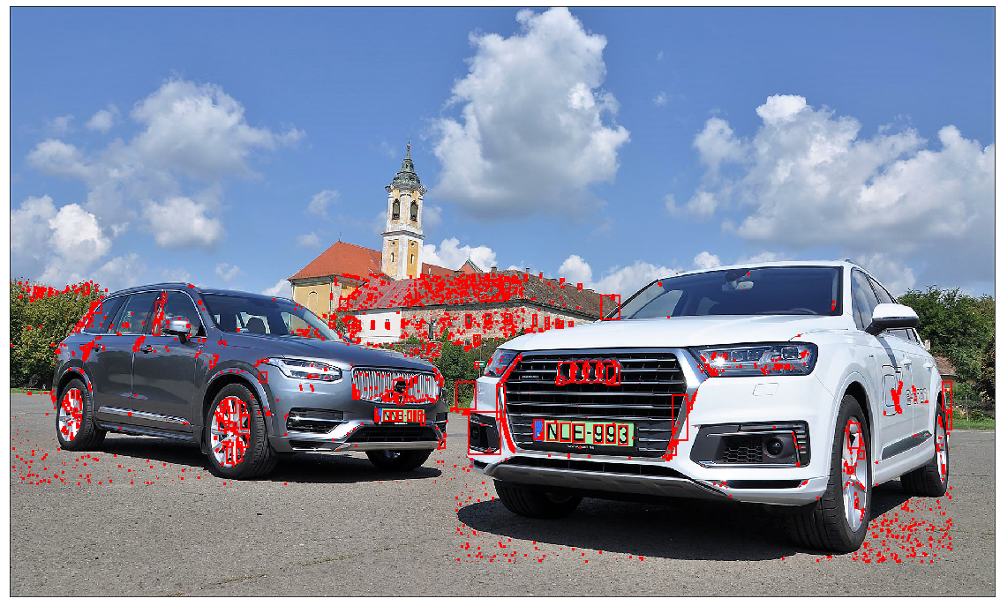

In [0]:
new_patches = {orig: [p for p in patches_ if 1 >= ((p.bbox[3] - p.bbox[1]) / (p.bbox[2] - p.bbox[0])) >= 0.2] for orig, patches_ in new_patches.items()}
fig, (ax2) = plt.subplots(1, figsize=(figsize, figsize))
plt.xticks([]),plt.yticks([])
ax2.imshow(img);
for orig, patches_ in new_patches.items():
  for p in patches_:
      bottom = p.bbox[1]
      left = p.bbox[0]
      top = p.bbox[3]
      right = p.bbox[2]
      width = right - left
      height = top - bottom
      rectBorder = matplotlib.patches.Rectangle((bottom, left), height, width, edgecolor="red", linewidth=2, fill=False)
      ax2.add_patch(rectBorder)

2. Size of 0.01-0.2 of the small patch (should not be too small or big)

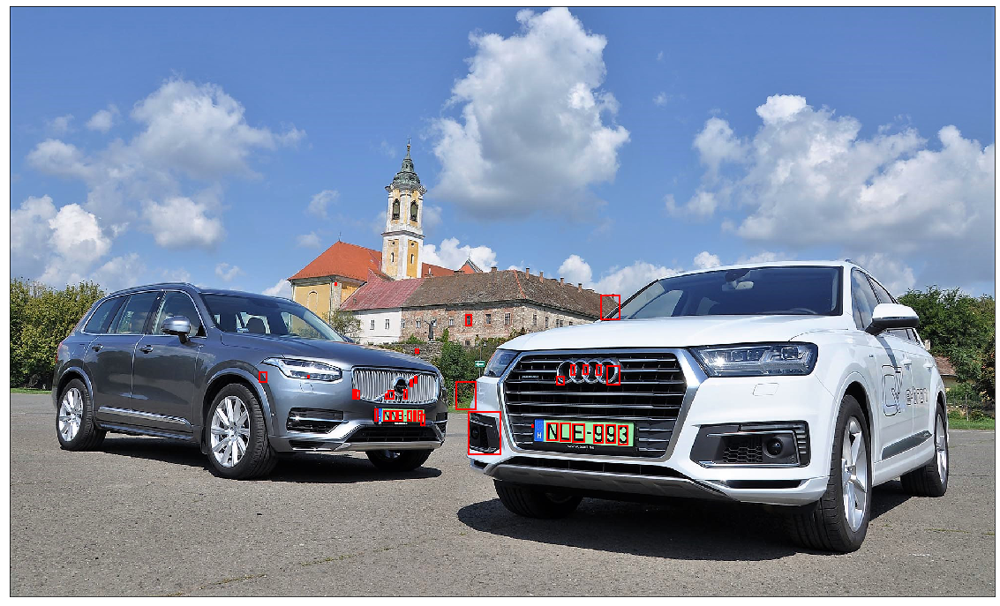

In [0]:
new_patches = [p for orig, patches_ in new_patches.items() for p in patches_ if 0.2 >= p.area / orig >= 0.01]
fig, (ax2) = plt.subplots(1, figsize=(figsize, figsize))
plt.xticks([]),plt.yticks([])
ax2.imshow(img);
for p in new_patches:
      bottom = p.bbox[1]
      left = p.bbox[0]
      top = p.bbox[3]
      right = p.bbox[2]
      width = right - left
      height = top - bottom
      rectBorder = matplotlib.patches.Rectangle((bottom, left), height, width, edgecolor="red", linewidth=2, fill=False)
      ax2.add_patch(rectBorder)

3. From these exclude the ones which are fully inside of an other (holes fo 8,9, etc.)
(Not necessary, prefilter takes care of this. Without prefilter too many initial patches to work with.)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if sys.path[0] == '':


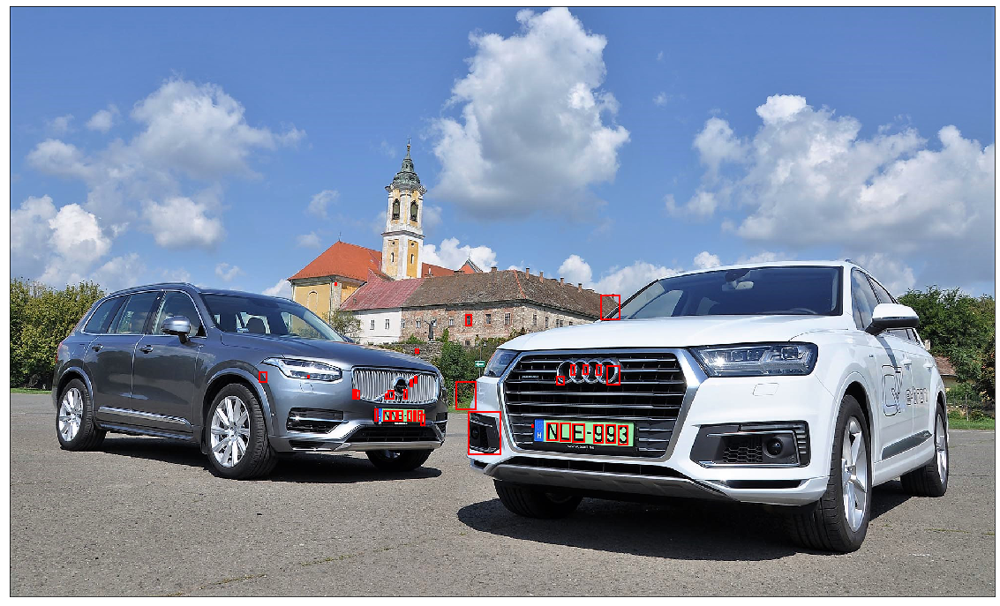

In [0]:
fig, (ax2) = plt.subplots(1, figsize=(figsize, figsize))
plt.xticks([]),plt.yticks([])
ax2.imshow(img);
newer_patches = []
for p in new_patches:
      all_x = np.array([range(pp.bbox[0], pp.bbox[2]) for pp in new_patches if pp is not p]).flatten()
      all_y = np.array([range(pp.bbox[1], pp.bbox[3]) for pp in new_patches if pp is not p]).flatten()
      bottom = p.bbox[1]
      left = p.bbox[0]
      top = p.bbox[3]
      right = p.bbox[2]
      if range(left, right) in all_x and range(bottom, top) in all_y:
        contiue
      width = right - left
      height = top - bottom
      rectBorder = matplotlib.patches.Rectangle((bottom, left), height, width, edgecolor="red", linewidth=2, fill=False)
      ax2.add_patch(rectBorder)
      newer_patches.append(p)

4. Keep those with the same height

[49, 20, 3, 87, 6, 19, 18, 19, 36, 15, 20, 12, 14, 19, 19, 16, 16, 9, 3, 56, 87, 24, 20, 21, 21, 20, 20, 20, 23, 3, 35, 36, 36, 36, 36, 37]
[ 5 10 10  6  1  1  1  0  0  2]
[3, 4, 5, 6, 7, 8, 9, 10, 11, 11, 12, 13, 14, 15, 16, 17, 18, 19, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 28, 29, 30, 31, 32, 33, 34, 35, 36]


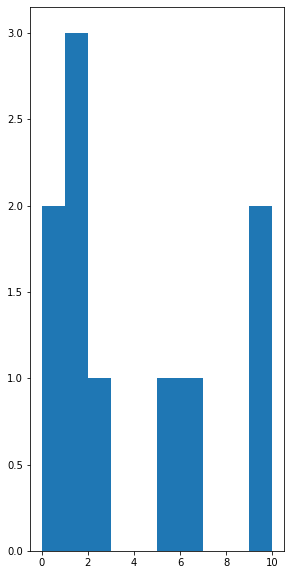

In [0]:

from itertools import chain
figure_size = 10
height_list = [p.bbox[2] - p.bbox[0] for p in newer_patches]
plt.figure(figsize=(figure_size,figure_size))
heights, height_bins = np.histogram(height_list, bins=10)
plt.subplot(1,2,1)
plt.hist(heights, bins=10);

height_range = list(chain.from_iterable([[i for i in range(int(e1), int(e2)+1)] for idx, (e1, e2) in enumerate(zip(height_bins, height_bins[1:])) if heights[idx] >= 5]))

print(height_list)
print(heights)
print(height_range)


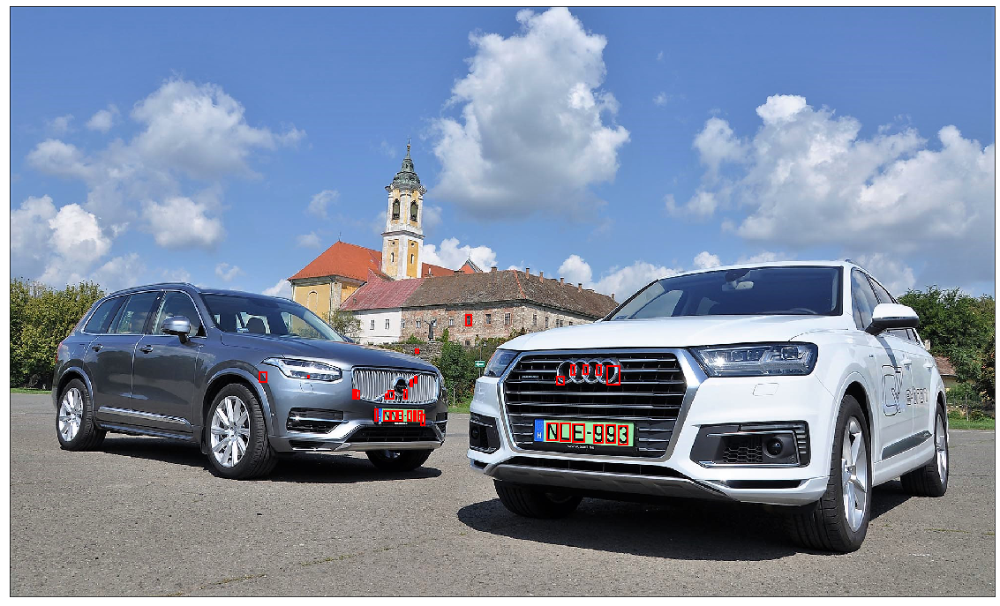

In [0]:
fig, (ax2) = plt.subplots(1, figsize=(figsize, figsize))
plt.xticks([]),plt.yticks([])
ax2.imshow(img);
newest_patches = []
for p in newer_patches:
      bottom = p.bbox[1]
      left = p.bbox[0]
      top = p.bbox[3]
      right = p.bbox[2]
      width = right - left
      height = top - bottom
      if int(height) not in height_range:
        continue
      rectBorder = matplotlib.patches.Rectangle((bottom, left), height, width, edgecolor="red", linewidth=2, fill=False)
      ax2.add_patch(rectBorder)
      newest_patches.append(p)

[628, 698, 730, 730, 730, 732, 753, 744, 753, 759, 779, 779, 782, 782, 789, 751, 819, 822, 822, 822, 823, 823, 823, 829, 847, 848, 849, 851, 852, 853]
[1 0 0 0 0 0 0 0 1 0 0 0 4 0 1 3 1 0 2 2 1 0 0 1 6 1 0 6]
[820, 821, 822, 823, 824, 825, 826, 827, 828, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853]


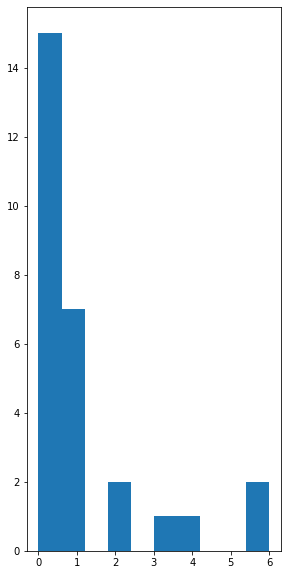

In [0]:
bottoms_list = [p.bbox[0] for p in newest_patches]
plt.figure(figsize=(figure_size,figure_size))
bottoms, bottom_bins = np.histogram(bottoms_list, bins=28)
plt.subplot(1,2,1)
plt.hist(bottoms, bins=10);

bottom_range = list(chain.from_iterable([[i for i in range(int(e1), int(e2)+1)] for idx, (e1, e2) in enumerate(zip(bottom_bins, bottom_bins[1:])) if bottoms[idx] >=6]))

print(bottoms_list)
print(bottoms)
print(bottom_range)

True


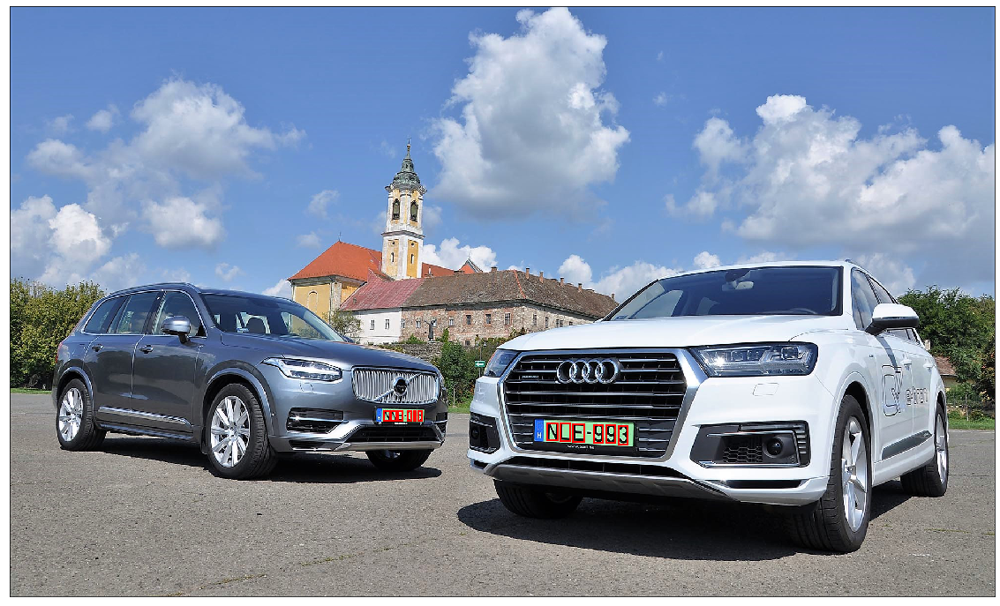

In [0]:
fig, (ax2) = plt.subplots(1, figsize=(figsize, figsize))
plt.xticks([]),plt.yticks([])
ax2.imshow(img);
newest_patches2 = []
for p in newest_patches:
      bottom = p.bbox[1]
      left = p.bbox[0]
      top = p.bbox[3]
      right = p.bbox[2]
      width = right - left
      height = top - bottom
      if int(left) not in bottom_range:
        continue
      rectBorder = matplotlib.patches.Rectangle((bottom, left), height, width, edgecolor="red", linewidth=2, fill=False)
      ax2.add_patch(rectBorder)
      newest_patches2.append(p)
      
print(len(newest_patches2)==12)